In [ ]:
import cv2
import numpy as np

In [ ]:
def compute_rgb_energy(image):
  img = image.astype(np.float64)
  total_energy = np.zeros(image.shape[:2], dtype = np.float64)

  for channel in range(3):
    single_channel = img[:, :, channel]
    grad_x = cv2.Sobel(single_channel, cv2.CV_64F, 1, 0, ksize = 3)
    grad_y = cv2.Sobel(single_channel, cv2.CV_64F, 0, 1, ksize = 3)
    total_energy += np.abs(grad_x) + np.abs(grad_y)

  total_energy[:, 0] = 999999.0
  total_energy[:, -1] = 999999.0

  return total_energy

In [ ]:
def compute_cost_matrix(energy):
  rows, cols = energy.shape
  M = energy.copy()

  for i in range(1, rows):
    for j in range(1, cols):
      left = max(0, j-1)
      right = min(cols-1, j+1)
      M[i, j] = energy[i, j] + np.min(M[i-1, left:right+1])
  return M

In [ ]:
def remove_seam_rgb(image, seam):
  rows, cols, channels = image.shape

  output = np.zeros((rows, cols-1, channels), dtype = np.uint8)
  for i in range(rows):
    j = seam[i]
    output[i, 0:j, :] = image[i, 0:j, :]
    output[i, j:cols-1,:] = image[i, j+1:cols, :]
  return output

In [ ]:
def find_optimal_seam(M):
  rows, cols = M.shape
  seam = np.zeros(rows, dtype = np.int32)

  seam[-1] = np.argmin(M[-1])
  for i in range(rows-2, -1, -1):
    prev_j = seam[i+1]
    left = max(0, prev_j-1)
    right = min(cols-1, prev_j+1)

    seam[i] = left+np.argmin(M[i, left:right+1])
  return seam


In [ ]:
def visualize_seam(image, seam):
  vis_image = np.copy(image)
  for i in range(vis_image.shape[0]):
    j = seam[i]
    vis_image[i, j] = [0, 0, 255]
  return vis_image

In [ ]:
def main():
  image_path = 'scenary2.jpeg'
  image = cv2.imread(image_path)

  if image is None:
    print(f'Error: Could not load {image_path}. Check if the file is in the same directory as your script.')
    return
  print('Image loaded successfully. Calculating the first seam...')

  energy = compute_rgb_energy(image)
  cost_mat = compute_cost_matrix(energy)
  first_seam = find_optimal_seam(cost_mat)

  vis_image = visualize_seam(image, first_seam)

  output_filename = 'scenary2_with_seam.jpeg'

  cv2.imwrite(output_filename, vis_image)

  print(f'Seam visualization saved as {output_filename}')

  cv2.waitKey(0)
  cv2.destroyAllWindows()

In [ ]:
if __name__ == '__main__':
  main()

Image loaded successfully. Calculating the first seam...
Seam visualization saved as scenary2_with_seam.jpeg


Starting Sobel Processing...
Removing seam 1/50 using SOBEL...
Removing seam 2/50 using SOBEL...
Removing seam 3/50 using SOBEL...
Removing seam 4/50 using SOBEL...
Removing seam 5/50 using SOBEL...
Removing seam 6/50 using SOBEL...
Removing seam 7/50 using SOBEL...
Removing seam 8/50 using SOBEL...
Removing seam 9/50 using SOBEL...
Removing seam 10/50 using SOBEL...
Removing seam 11/50 using SOBEL...
Removing seam 12/50 using SOBEL...
Removing seam 13/50 using SOBEL...
Removing seam 14/50 using SOBEL...
Removing seam 15/50 using SOBEL...
Removing seam 16/50 using SOBEL...
Removing seam 17/50 using SOBEL...
Removing seam 18/50 using SOBEL...
Removing seam 19/50 using SOBEL...
Removing seam 20/50 using SOBEL...
Removing seam 21/50 using SOBEL...
Removing seam 22/50 using SOBEL...
Removing seam 23/50 using SOBEL...
Removing seam 24/50 using SOBEL...
Removing seam 25/50 using SOBEL...
Removing seam 26/50 using SOBEL...
Removing seam 27/50 using SOBEL...
Removing seam 28/50 using SOBEL...


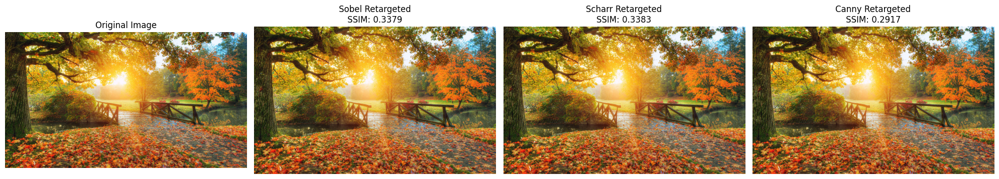

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

def compute_energy_map(image, operator='scharr'):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    if operator == 'sobel':
        grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
        grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
        energy_map = np.abs(grad_x) + np.abs(grad_y)

    elif operator == 'scharr':
        grad_x = cv2.Scharr(gray, cv2.CV_64F, 1, 0)
        grad_y = cv2.Scharr(gray, cv2.CV_64F, 0, 1)
        energy_map = np.abs(grad_x) + np.abs(grad_y)

    elif operator == 'canny_hybrid':
        # 1. Get the base continuous landscape (using Scharr for better texture)
        grad_x = cv2.Scharr(gray, cv2.CV_64F, 1, 0)
        grad_y = cv2.Scharr(gray, cv2.CV_64F, 0, 1)
        base_energy = np.abs(grad_x) + np.abs(grad_y)

        # 2. Get the hard edges using Canny (thresholds 100 and 200)
        # We blur the image slightly first to remove noise before Canny
        blurred = cv2.GaussianBlur(gray, (3, 3), 0)
        canny_edges = cv2.Canny(blurred, 100, 200)

        # 3. Blur the Canny edges to create the "halo" effect
        canny_halo = cv2.GaussianBlur(canny_edges, (15, 15), 0)

        # 4. Combine them. We multiply Canny by a weight to make it act like a "wall"
        # Convert Canny to float64 to match base_energy
        energy_map = base_energy + (canny_halo.astype(np.float64) * 2.0)

    return energy_map

def find_minimum_seam(energy):
    """Uses Dynamic Programming to find the vertical seam with the lowest energy."""
    r, c = energy.shape
    M = energy.copy()
    backtrack = np.zeros_like(M, dtype=int)

    # Populate the cost matrix M
    for i in range(1, r):
        for j in range(c):
            # Handle the left edge
            if j == 0:
                idx = np.argmin(M[i-1, j:j+2])
                backtrack[i, j] = idx + j
                min_energy = M[i-1, idx + j]
            # Handle the right edge
            elif j == c - 1:
                idx = np.argmin(M[i-1, j-1:j+1])
                backtrack[i, j] = idx + j - 1
                min_energy = M[i-1, idx + j - 1]
            # Handle the middle pixels
            else:
                idx = np.argmin(M[i-1, j-1:j+2])
                backtrack[i, j] = idx + j - 1
                min_energy = M[i-1, idx + j - 1]

            M[i, j] += min_energy

    # Backtracking to find the path
    seam = []
    j = np.argmin(M[-1]) # Find the min value in the bottom row
    for i in range(r-1, -1, -1):
        seam.append((i, j))
        j = backtrack[i, j]

    return seam[::-1] # Reverse to go from top to bottom

def remove_vertical_seam(image, seam):
    """Removes the pixels specified by the seam from the image."""
    r, c = image.shape[:2]
    # Create a boolean mask initialized to True
    mask = np.ones((r, c), dtype=bool)

    # Set the mask to False at the seam coordinates
    for i, j in seam:
        mask[i, j] = False

    # Apply the mask and reshape the image to have 1 less column
    if len(image.shape) == 3:
        mask = np.stack([mask] * 3, axis=2)
        new_image = image[mask].reshape((r, c - 1, 3))
    else:
        new_image = image[mask].reshape((r, c - 1))

    return new_image

def seam_carve(image, num_seams, operator='sobel'):
    """Iteratively removes num_seams from the image."""
    output = np.copy(image)
    for i in range(num_seams):
        print(f"Removing seam {i+1}/{num_seams} using {operator.upper()}...")
        energy = compute_energy_map(output, operator=operator)
        seam = find_minimum_seam(energy)
        output = remove_vertical_seam(output, seam)
    return output

def calculate_ssim(original, carved):
    """Calculates Structural Similarity Index between original and carved image."""
    # Resize the original to match the carved image size for fair comparison
    # using standard cv2.resize (which ignores content awareness)
    resized_original = cv2.resize(original, (carved.shape[1], carved.shape[0]), interpolation=cv2.INTER_AREA)

    # Convert to grayscale for SSIM calculation
    gray_orig = cv2.cvtColor(resized_original, cv2.COLOR_BGR2GRAY)
    gray_carved = cv2.cvtColor(carved, cv2.COLOR_BGR2GRAY)

    score, _ = ssim(gray_orig, gray_carved, full=True)
    return score

# ==========================================
# MAIN EXECUTION SCRIPT
# ==========================================
if __name__ == "__main__":
    # 1. Load your test image (replace 'test_image.jpg' with your file path)
    # Hint: Use an image with a mix of flat areas and sharp textures
    image_path = "scenary.jpeg"
    image = cv2.imread(image_path)

    if image is None:
        print("Error: Could not load image. Please check the file path.")
    else:
        # Number of pixels to remove from the width
        seams_to_remove = 50

        # 2. Process using Sobel
        print("Starting Sobel Processing...")
        sobel_result = seam_carve(image, seams_to_remove, operator='sobel')
        sobel_ssim = calculate_ssim(image, sobel_result)

        # 3. Process using Scharr
        print("\nStarting Scharr Processing...")
        scharr_result = seam_carve(image, seams_to_remove, operator='scharr')
        scharr_ssim = calculate_ssim(image, scharr_result)


        print("Starting Canny Processing...")
        canny_result = seam_carve(image, seams_to_remove, operator='canny_hybrid')
        canny_ssim = calculate_ssim(image, canny_result)


        # 4. Print the final metrics
        print("\n=== RESULTS ===")
        print(f"Sobel SSIM Score:  {sobel_ssim:.4f}")
        print(f"Scharr SSIM Score: {scharr_ssim:.4f}")
        print(f"Canny SSIM Score: {canny_ssim:.4f}")

        # 5. Visualize the results
        # Convert BGR (OpenCV format) to RGB (Matplotlib format) for display
        img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        sobel_rgb = cv2.cvtColor(sobel_result, cv2.COLOR_BGR2RGB)
        scharr_rgb = cv2.cvtColor(scharr_result, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(20, 5))
        plt.subplot(1, 4, 1)
        plt.title("Original Image")
        plt.imshow(img_rgb)
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.title(f"Sobel Retargeted\nSSIM: {sobel_ssim:.4f}")
        plt.imshow(sobel_rgb)
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.title(f"Scharr Retargeted\nSSIM: {scharr_ssim:.4f}")
        plt.imshow(scharr_rgb)
        plt.axis('off')

        plt.subplot(1, 4, 4)
        plt.title(f"Canny Retargeted\nSSIM: {canny_ssim:.4f}")
        plt.imshow(scharr_rgb)
        plt.axis('off')

        plt.tight_layout()
        plt.show()

In [ ]:
def binary_search_auto_carve(image, max_seams, ssim_threshold=0.85, operator='scharr'):
    """
    Uses binary search to find the maximum number of seams to remove
    while maintaining an SSIM score >= threshold.
    """
    low = 0
    high = max_seams
    best_seams = 0
    best_image = np.copy(image)
    best_ssim = 1.0

    print(f"\n--- Starting Binary Search ({operator.upper()}) ---")
    print(f"Target Threshold: SSIM >= {ssim_threshold}")
    print(f"Search Bounds: 0 to {max_seams} seams")

    while low <= high:
        mid = (low + high) // 2
        print(f"\n> Testing removal of {mid} seams...")

        # Call your existing seam_carve function
        # (It starts from the original image and removes 'mid' seams)
        test_image = seam_carve(image, mid, operator)

        # Calculate the structural integrity
        current_ssim = calculate_ssim(image, test_image)
        print(f"> Result for {mid} seams: SSIM = {current_ssim:.4f}")

        if current_ssim >= ssim_threshold:
            # The image survived! Save this as the best result so far.
            best_seams = mid
            best_image = test_image
            best_ssim = current_ssim

            # Try to push the limit and remove MORE seams
            low = mid + 1
        else:
            # The image degraded too much. We must remove FEWER seams.
            high = mid - 1

    print(f"\n✅ Search Complete for {operator.upper()}!")
    print(f"Optimal seams to remove: {best_seams} (Final SSIM: {best_ssim:.4f})")

    return best_image, best_seams, best_ssim


--- Starting Binary Search (SOBEL) ---
Target Threshold: SSIM >= 0.85
Search Bounds: 0 to 159 seams

> Testing removal of 79 seams...
Removing seam 1/79 using SOBEL...
Removing seam 2/79 using SOBEL...
Removing seam 3/79 using SOBEL...
Removing seam 4/79 using SOBEL...
Removing seam 5/79 using SOBEL...
Removing seam 6/79 using SOBEL...
Removing seam 7/79 using SOBEL...
Removing seam 8/79 using SOBEL...
Removing seam 9/79 using SOBEL...
Removing seam 10/79 using SOBEL...
Removing seam 11/79 using SOBEL...
Removing seam 12/79 using SOBEL...
Removing seam 13/79 using SOBEL...
Removing seam 14/79 using SOBEL...
Removing seam 15/79 using SOBEL...
Removing seam 16/79 using SOBEL...
Removing seam 17/79 using SOBEL...
Removing seam 18/79 using SOBEL...
Removing seam 19/79 using SOBEL...
Removing seam 20/79 using SOBEL...
Removing seam 21/79 using SOBEL...
Removing seam 22/79 using SOBEL...
Removing seam 23/79 using SOBEL...
Removing seam 24/79 using SOBEL...
Removing seam 25/79 using SOBEL...

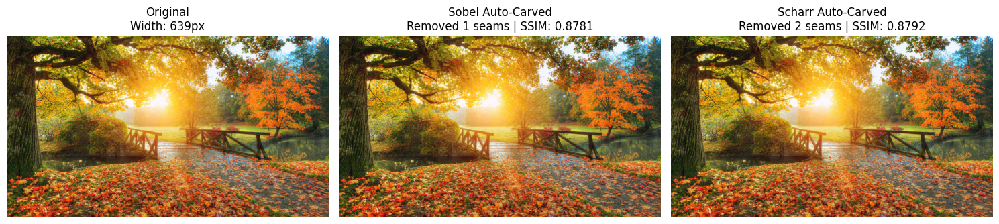

In [ ]:
# ==========================================
# MAIN EXECUTION SCRIPT (BINARY SEARCH)
# ==========================================
if __name__ == "__main__":
    # 1. Load your test image
    image_path = "scenary.jpeg"  # Ensure this matches your Colab file name
    image = cv2.imread(image_path)

    if image is None:
        print("Error: Could not load image. Please check the file path.")
    else:
        # Determine a safe upper bound for the search (e.g., 25% of the image width)
        max_search_limit = int(image.shape[1] * 0.25)
        target_ssim = 0.1

        # 2. Run Binary Search for SOBEL
        sobel_img, sobel_count, sobel_score = binary_search_auto_carve(
            image,
            max_seams=50,
            ssim_threshold=target_ssim,
            operator='sobel'
        )

        # 3. Run Binary Search for SCHARR
        scharr_img, scharr_count, scharr_score = binary_search_auto_carve(
            image,
            max_seams=50,
            ssim_threshold=target_ssim,
            operator='scharr'
        )

        # 4. Print the final comparative metrics for the report
        print("\n" + "="*40)
        print("FINAL QUAD VISION COMPRESSION REPORT")
        print("="*40)
        print(f"Original Image Width: {image.shape[1]}px")
        print(f"Sobel Operator:  Removed {sobel_count} seams (SSIM: {sobel_score:.4f})")
        print(f"Scharr Operator: Removed {scharr_count} seams (SSIM: {scharr_score:.4f})")

        # 5. Visualize the final optimal outputs side-by-side
        img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        sobel_rgb = cv2.cvtColor(sobel_img, cv2.COLOR_BGR2RGB)
        scharr_rgb = cv2.cvtColor(scharr_img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(15, 6))

        plt.subplot(1, 3, 1)
        plt.title(f"Original\nWidth: {image.shape[1]}px")
        plt.imshow(img_rgb)
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title(f"Sobel Auto-Carved\nRemoved {sobel_count} seams | SSIM: {sobel_score:.4f}")
        plt.imshow(sobel_rgb)
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title(f"Scharr Auto-Carved\nRemoved {scharr_count} seams | SSIM: {scharr_score:.4f}")
        plt.imshow(scharr_rgb)
        plt.axis('off')

        plt.tight_layout()
        plt.show()

QUAD VISION: 3-CHANNEL SOBEL vs SCHARR COMPRESSION TEST
Image Width: 639px | Max Search Boundary: 127 seams

--- Starting 3-Channel Search: SOBEL ---
> Testing 63 seams...
  Result: SSIM = 0.1921
> Testing 31 seams...
  Result: SSIM = 0.2554
> Testing 15 seams...
  Result: SSIM = 0.3403
> Testing 7 seams...
  Result: SSIM = 0.4900
> Testing 3 seams...
  Result: SSIM = 0.5897
> Testing 5 seams...
  Result: SSIM = 0.4574
> Testing 4 seams...
  Result: SSIM = 0.5160
✅ Optimal seams: 4 (SSIM: 0.5160)

--- Starting 3-Channel Search: SCHARR ---
> Testing 63 seams...
  Result: SSIM = 0.1875
> Testing 31 seams...
  Result: SSIM = 0.2523
> Testing 15 seams...
  Result: SSIM = 0.3409
> Testing 7 seams...
  Result: SSIM = 0.4878
> Testing 3 seams...
  Result: SSIM = 0.5891
> Testing 5 seams...
  Result: SSIM = 0.5933
> Testing 6 seams...
  Result: SSIM = 0.5371
✅ Optimal seams: 6 (SSIM: 0.5371)

FINAL QUAD VISION COMPRESSION REPORT
3-Channel Sobel : Removed 4 seams (SSIM: 0.5160)
3-Channel Scharr

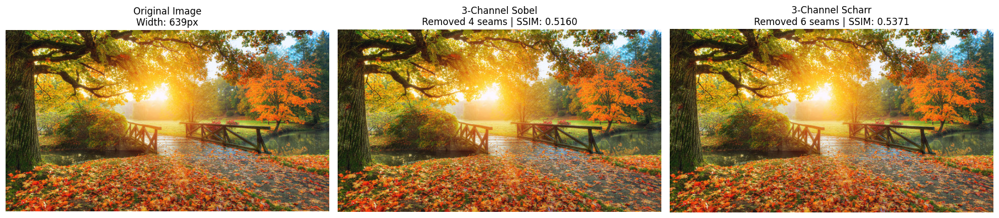

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

# ==========================================
# 1. 3-CHANNEL ENERGY FUNCTIONS
# ==========================================
def compute_energy_map(image, operator='scharr'):
    """
    Calculates the energy map by evaluating all 3 color channels
    independently to prevent luminance camouflage.
    """
    # Split the image into its Blue, Green, and Red channels (OpenCV format)
    b, g, r = cv2.split(image)
    channels = [b, g, r]

    # Initialize a blank canvas for the master energy map
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)

    for ch in channels:
        if operator == 'sobel':
            grad_x = cv2.Sobel(ch, cv2.CV_64F, 1, 0, ksize=3)
            grad_y = cv2.Sobel(ch, cv2.CV_64F, 0, 1, ksize=3)
        elif operator == 'scharr':
            grad_x = cv2.Scharr(ch, cv2.CV_64F, 1, 0)
            grad_y = cv2.Scharr(ch, cv2.CV_64F, 0, 1)
        else:
            raise ValueError("Operator must be 'sobel' or 'scharr'")

        # Absolute gradient magnitude for the current color channel
        channel_energy = np.abs(grad_x) + np.abs(grad_y)

        # Add it to the total landscape
        total_energy += channel_energy

    return total_energy

# ==========================================
# 2. CORE SEAM CARVING LOGIC
# ==========================================
def find_minimum_seam(energy):
    """Dynamic Programming to find the lowest energy vertical path."""
    r, c = energy.shape
    M = energy.copy()
    backtrack = np.zeros_like(M, dtype=int)

    for i in range(1, r):
        for j in range(c):
            # Left edge
            if j == 0:
                idx = np.argmin(M[i-1, j:j+2])
                backtrack[i, j] = idx + j
                min_energy = M[i-1, idx + j]
            # Right edge
            elif j == c - 1:
                idx = np.argmin(M[i-1, j-1:j+1])
                backtrack[i, j] = idx + j - 1
                min_energy = M[i-1, idx + j - 1]
            # Middle pixels
            else:
                idx = np.argmin(M[i-1, j-1:j+2])
                backtrack[i, j] = idx + j - 1
                min_energy = M[i-1, idx + j - 1]

            M[i, j] += min_energy

    # Backtracking
    seam = []
    j = np.argmin(M[-1])
    for i in range(r-1, -1, -1):
        seam.append((i, j))
        j = backtrack[i, j]

    return seam[::-1]

def remove_vertical_seam(image, seam):
    """Quickly removes the seam using a boolean mask."""
    r, c = image.shape[:2]
    mask = np.ones((r, c), dtype=bool)
    for i, j in seam:
        mask[i, j] = False

    if len(image.shape) == 3:
        mask = np.stack([mask] * 3, axis=2)
        return image[mask].reshape((r, c - 1, 3))
    else:
        return image[mask].reshape((r, c - 1))

def seam_carve(image, num_seams, operator='scharr'):
    """Removes N seams using the specified operator."""
    output = np.copy(image)
    for _ in range(num_seams):
        energy = compute_energy_map(output, operator=operator)
        seam = find_minimum_seam(energy)
        output = remove_vertical_seam(output, seam)
    return output

# ==========================================
# 3. EVALUATION & AUTOMATION (BINARY SEARCH)
# ==========================================
def calculate_ssim(original, carved):
    """Calculates Structural Similarity Index against a standard resize."""
    # Resize the original down to the carved size to compare apples to apples
    resized_original = cv2.resize(original, (carved.shape[1], carved.shape[0]), interpolation=cv2.INTER_AREA)
    gray_orig = cv2.cvtColor(resized_original, cv2.COLOR_BGR2GRAY)
    gray_carved = cv2.cvtColor(carved, cv2.COLOR_BGR2GRAY)

    score, _ = ssim(gray_orig, gray_carved, full=True)
    return score

def binary_search_auto_carve(image, max_seams, ssim_threshold=0.85, operator='scharr'):
    """Finds maximum removable seams while maintaining image quality >= threshold."""
    low = 0
    high = max_seams
    best_seams = 0
    best_image = np.copy(image)
    best_ssim = 1.0

    print(f"\n--- Starting 3-Channel Search: {operator.upper()} ---")

    while low <= high:
        mid = (low + high) // 2
        print(f"> Testing {mid} seams...")

        test_image = seam_carve(image, mid, operator)
        current_ssim = calculate_ssim(image, test_image)

        print(f"  Result: SSIM = {current_ssim:.4f}")

        if current_ssim >= ssim_threshold:
            # Succeeded! Save results and try to remove more seams
            best_seams = mid
            best_image = test_image
            best_ssim = current_ssim
            low = mid + 1
        else:
            # Failed (Quality dropped too low). Try removing fewer seams.
            high = mid - 1

    print(f"✅ Optimal seams: {best_seams} (SSIM: {best_ssim:.4f})")
    return best_image, best_seams, best_ssim

# ==========================================
# 4. MAIN EXECUTION
# ==========================================
if __name__ == "__main__":
    # ---> CHANGE THIS TO YOUR UPLOADED IMAGE NAME <---
    image_path = "scenary.jpeg"
    image = cv2.imread(image_path)

    if image is None:
        print("Error: Could not load image. Check the exact file name in your Colab files.")
    else:
        # --- Configuration ---
        target_ssim = 0.50
        # Set max limit to 20% of image width to save processing time
        max_search_limit = int(image.shape[1] * 0.20)

        print("="*60)
        print("QUAD VISION: 3-CHANNEL SOBEL vs SCHARR COMPRESSION TEST")
        print(f"Image Width: {image.shape[1]}px | Max Search Boundary: {max_search_limit} seams")
        print("="*60)

        # 1. Run Advanced 3-Channel Sobel
        sobel_img, sobel_count, sobel_score = binary_search_auto_carve(
            image, max_search_limit, target_ssim, operator='sobel'
        )

        # 2. Run Advanced 3-Channel Scharr
        scharr_img, scharr_count, scharr_score = binary_search_auto_carve(
            image, max_search_limit, target_ssim, operator='scharr'
        )

        # 3. Final Output Metrics
        print("\n" + "="*40)
        print("FINAL QUAD VISION COMPRESSION REPORT")
        print("="*40)
        print(f"3-Channel Sobel : Removed {sobel_count} seams (SSIM: {sobel_score:.4f})")
        print(f"3-Channel Scharr: Removed {scharr_count} seams (SSIM: {scharr_score:.4f})")

        # 4. Visualize
        img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        sobel_rgb = cv2.cvtColor(sobel_img, cv2.COLOR_BGR2RGB)
        scharr_rgb = cv2.cvtColor(scharr_img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(18, 6))

        plt.subplot(1, 3, 1)
        plt.title(f"Original Image\nWidth: {image.shape[1]}px")
        plt.imshow(img_rgb)
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title(f"3-Channel Sobel\nRemoved {sobel_count} seams | SSIM: {sobel_score:.4f}")
        plt.imshow(sobel_rgb)
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title(f"3-Channel Scharr\nRemoved {scharr_count} seams | SSIM: {scharr_score:.4f}")
        plt.imshow(scharr_rgb)
        plt.axis('off')

        plt.tight_layout()
        plt.show()

QUAD VISION: MULTI-METRIC COMPRESSION TEST (SSIM + EPR)
Image Width: 639px | Max Search Boundary: 191 seams

--- Starting 3-Channel Search: SOBEL ---
> Testing 95 seams...
  Result: SSIM = 0.1555
> Testing 47 seams...
  Result: SSIM = 0.2167
> Testing 23 seams...
  Result: SSIM = 0.2857
> Testing 11 seams...
  Result: SSIM = 0.4105
> Testing 5 seams...
  Result: SSIM = 0.4574
> Testing 2 seams...
  Result: SSIM = 0.7139
> Testing 3 seams...
  Result: SSIM = 0.5897
✅ Optimal seams: 2 (SSIM: 0.7139 | EPR: 1.0014)

--- Starting 3-Channel Search: SCHARR ---
> Testing 95 seams...
  Result: SSIM = 0.1535
> Testing 47 seams...
  Result: SSIM = 0.2155
> Testing 23 seams...
  Result: SSIM = 0.2800
> Testing 11 seams...
  Result: SSIM = 0.4099
> Testing 5 seams...
  Result: SSIM = 0.5933
> Testing 2 seams...
  Result: SSIM = 0.7155
> Testing 3 seams...
  Result: SSIM = 0.5891
✅ Optimal seams: 2 (SSIM: 0.7155 | EPR: 1.0015)

FINAL QUAD VISION COMPRESSION REPORT
3-Channel Sobel : Removed 2 seams |

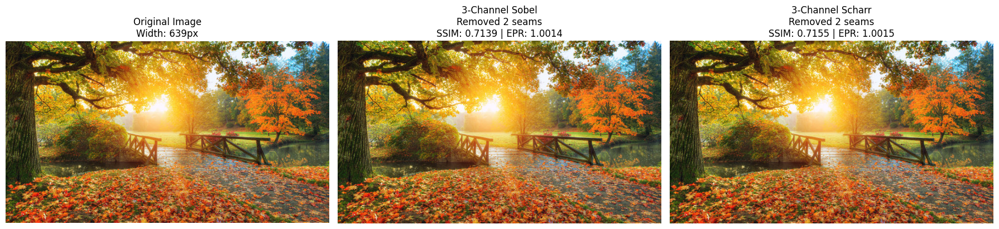

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

# ==========================================
# 1. 3-CHANNEL ENERGY FUNCTIONS
# ==========================================
def compute_energy_map(image, operator='scharr'):
    """
    Calculates the energy map by evaluating all 3 color channels
    independently to prevent luminance camouflage.
    """
    b, g, r = cv2.split(image)
    channels = [b, g, r]

    total_energy = np.zeros(image.shape[:2], dtype=np.float64)

    for ch in channels:
        if operator == 'sobel':
            grad_x = cv2.Sobel(ch, cv2.CV_64F, 1, 0, ksize=3)
            grad_y = cv2.Sobel(ch, cv2.CV_64F, 0, 1, ksize=3)
        elif operator == 'scharr':
            grad_x = cv2.Scharr(ch, cv2.CV_64F, 1, 0)
            grad_y = cv2.Scharr(ch, cv2.CV_64F, 0, 1)
        else:
            raise ValueError("Operator must be 'sobel' or 'scharr'")

        channel_energy = np.abs(grad_x) + np.abs(grad_y)
        total_energy += channel_energy

    return total_energy

# ==========================================
# 2. CORE SEAM CARVING LOGIC
# ==========================================
def find_minimum_seam(energy):
    """Dynamic Programming to find the lowest energy vertical path."""
    r, c = energy.shape
    M = energy.copy()
    backtrack = np.zeros_like(M, dtype=int)

    for i in range(1, r):
        for j in range(c):
            if j == 0:
                idx = np.argmin(M[i-1, j:j+2])
                backtrack[i, j] = idx + j
                min_energy = M[i-1, idx + j]
            elif j == c - 1:
                idx = np.argmin(M[i-1, j-1:j+1])
                backtrack[i, j] = idx + j - 1
                min_energy = M[i-1, idx + j - 1]
            else:
                idx = np.argmin(M[i-1, j-1:j+2])
                backtrack[i, j] = idx + j - 1
                min_energy = M[i-1, idx + j - 1]

            M[i, j] += min_energy

    seam = []
    j = np.argmin(M[-1])
    for i in range(r-1, -1, -1):
        seam.append((i, j))
        j = backtrack[i, j]

    return seam[::-1]

def remove_vertical_seam(image, seam):
    """Quickly removes the seam using a boolean mask."""
    r, c = image.shape[:2]
    mask = np.ones((r, c), dtype=bool)
    for i, j in seam:
        mask[i, j] = False

    if len(image.shape) == 3:
        mask = np.stack([mask] * 3, axis=2)
        return image[mask].reshape((r, c - 1, 3))
    else:
        return image[mask].reshape((r, c - 1))

def seam_carve(image, num_seams, operator='scharr'):
    """Removes N seams using the specified operator."""
    output = np.copy(image)
    for _ in range(num_seams):
        energy = compute_energy_map(output, operator=operator)
        seam = find_minimum_seam(energy)
        output = remove_vertical_seam(output, seam)
    return output

# ==========================================
# 3. EVALUATION & AUTOMATION METRICS
# ==========================================
def calculate_ssim(original, carved):
    """Calculates Structural Similarity Index against a standard resize."""
    resized_original = cv2.resize(original, (carved.shape[1], carved.shape[0]), interpolation=cv2.INTER_AREA)
    gray_orig = cv2.cvtColor(resized_original, cv2.COLOR_BGR2GRAY)
    gray_carved = cv2.cvtColor(carved, cv2.COLOR_BGR2GRAY)

    score, _ = ssim(gray_orig, gray_carved, full=True)
    return score

def calculate_epr(original, carved, operator):
    """
    Calculates the Energy Preservation Ratio (EPR).
    A score >= 1.0 means the algorithm successfully kept high-energy pixels
    and only deleted low-energy (boring) pixels.
    """
    # Calculate total energy landscapes for both images
    energy_orig = compute_energy_map(original, operator)
    energy_carved = compute_energy_map(carved, operator)

    # Calculate the average energy per pixel
    mean_orig = np.mean(energy_orig)
    mean_carved = np.mean(energy_carved)

    # Prevent division by zero
    if mean_orig == 0:
        return 1.0

    return mean_carved / mean_orig

def binary_search_auto_carve(image, max_seams, ssim_threshold=0.65, operator='scharr'):
    """Finds maximum removable seams while maintaining image quality."""
    low = 0
    high = max_seams
    best_seams = 0
    best_image = np.copy(image)
    best_ssim = 1.0

    print(f"\n--- Starting 3-Channel Search: {operator.upper()} ---")

    while low <= high:
        mid = (low + high) // 2
        print(f"> Testing {mid} seams...")

        test_image = seam_carve(image, mid, operator)
        current_ssim = calculate_ssim(image, test_image)

        print(f"  Result: SSIM = {current_ssim:.4f}")

        if current_ssim >= ssim_threshold:
            best_seams = mid
            best_image = test_image
            best_ssim = current_ssim
            low = mid + 1
        else:
            high = mid - 1

    # Calculate EPR for the final optimized image
    final_epr = calculate_epr(image, best_image, operator)

    print(f"✅ Optimal seams: {best_seams} (SSIM: {best_ssim:.4f} | EPR: {final_epr:.4f})")
    return best_image, best_seams, best_ssim, final_epr

# ==========================================
# 4. MAIN EXECUTION
# ==========================================
if __name__ == "__main__":
    # ---> CHANGE THIS TO YOUR UPLOADED IMAGE NAME <---
    image_path = "scenary.jpeg"  # Update this to match your actual file
    image = cv2.imread(image_path)

    if image is None:
        print("Error: Could not load image. Check the exact file name in your Colab files.")
    else:
        # --- Configuration ---
        # Lowered to 0.65 to bypass the 1-pixel shift penalty and force deeper carving
        target_ssim = 0.65
        # Set max limit to 30% of image width
        max_search_limit = int(image.shape[1] * 0.30)

        print("="*65)
        print("QUAD VISION: MULTI-METRIC COMPRESSION TEST (SSIM + EPR)")
        print(f"Image Width: {image.shape[1]}px | Max Search Boundary: {max_search_limit} seams")
        print("="*65)

        # 1. Run Advanced 3-Channel Sobel
        sobel_img, sobel_count, sobel_score, sobel_epr = binary_search_auto_carve(
            image, max_search_limit, target_ssim, operator='sobel'
        )

        # 2. Run Advanced 3-Channel Scharr
        scharr_img, scharr_count, scharr_score, scharr_epr = binary_search_auto_carve(
            image, max_search_limit, target_ssim, operator='scharr'
        )

        # 3. Final Output Metrics
        print("\n" + "="*50)
        print("FINAL QUAD VISION COMPRESSION REPORT")
        print("="*50)
        print(f"3-Channel Sobel : Removed {sobel_count} seams | SSIM: {sobel_score:.4f} | EPR: {sobel_epr:.4f}")
        print(f"3-Channel Scharr: Removed {scharr_count} seams | SSIM: {scharr_score:.4f} | EPR: {scharr_epr:.4f}")

        # 4. Visualize
        img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        sobel_rgb = cv2.cvtColor(sobel_img, cv2.COLOR_BGR2RGB)
        scharr_rgb = cv2.cvtColor(scharr_img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(18, 7))

        plt.subplot(1, 3, 1)
        plt.title(f"Original Image\nWidth: {image.shape[1]}px")
        plt.imshow(img_rgb)
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title(f"3-Channel Sobel\nRemoved {sobel_count} seams\nSSIM: {sobel_score:.4f} | EPR: {sobel_epr:.4f}")
        plt.imshow(sobel_rgb)
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title(f"3-Channel Scharr\nRemoved {scharr_count} seams\nSSIM: {scharr_score:.4f} | EPR: {scharr_epr:.4f}")
        plt.imshow(scharr_rgb)
        plt.axis('off')

        plt.tight_layout()
        plt.show()

In [ ]:
# ==========================================
# 4. MAIN EXECUTION (THE TORTURE TEST)
# ==========================================
if __name__ == "__main__":
    image_path = "scenary4.jpg" # Make sure this matches your filename
    image = cv2.imread(image_path)

    if image is None:
        print("Error: Could not load image.")
    else:
        # We are forcing the algorithm to remove 50 seams regardless of SSIM
        seams_to_remove = 50

        print("="*65)
        print(f"QUAD VISION: 50-SEAM TORTURE TEST")
        print(f"Original Width: {image.shape[1]}px | Target Width: {image.shape[1] - seams_to_remove}px")
        print("="*65)

        # 1. Run 3-Channel Sobel
        print("\n> Carving 50 seams with 3-Channel Sobel...")
        sobel_img = seam_carve(image, seams_to_remove, operator='sobel')
        sobel_ssim = calculate_ssim(image, sobel_img)
        sobel_epr = calculate_epr(image, sobel_img, operator='sobel')

        # 2. Run 3-Channel Scharr
        print("> Carving 50 seams with 3-Channel Scharr...")
        scharr_img = seam_carve(image, seams_to_remove, operator='scharr')
        scharr_ssim = calculate_ssim(image, scharr_img)
        scharr_epr = calculate_epr(image, scharr_img, operator='scharr')

        # 3. Final Output Metrics
        print("\n" + "="*50)
        print("FINAL QUAD VISION TORTURE TEST REPORT")
        print("="*50)
        print(f"3-Channel Sobel : SSIM: {sobel_ssim:.4f} | EPR: {sobel_epr:.4f}")
        print(f"3-Channel Scharr: SSIM: {scharr_ssim:.4f} | EPR: {scharr_epr:.4f}")

        # 4. Visualize
        img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        sobel_rgb = cv2.cvtColor(sobel_img, cv2.COLOR_BGR2RGB)
        scharr_rgb = cv2.cvtColor(scharr_img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(18, 7))

        plt.subplot(1, 3, 1)
        plt.title(f"Original Image\nWidth: {image.shape[1]}px")
        plt.imshow(img_rgb)
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title(f"3-Channel Sobel (-{seams_to_remove}px)\nSSIM: {sobel_ssim:.4f} | EPR: {sobel_epr:.4f}")
        plt.imshow(sobel_rgb)
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title(f"3-Channel Scharr (-{seams_to_remove}px)\nSSIM: {scharr_ssim:.4f} | EPR: {scharr_epr:.4f}")
        plt.imshow(scharr_rgb)
        plt.axis('off')

        plt.tight_layout()
        plt.show()

QUAD VISION: 50-SEAM TORTURE TEST
Original Width: 5616px | Target Width: 5566px

> Carving 50 seams with 3-Channel Sobel...
> Carving 50 seams with 3-Channel Scharr...


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from PIL import Image
import io

def get_frame(matrix, highlight_cells, title):
    """
    Renders a 4x4 matrix as an image frame.
    highlight_cells: list of (row, col) tuples to highlight in red.
    """
    fig, ax = plt.subplots(figsize=(5, 5))

    # Create a base color grid (0 = white/empty, 1 = light gray for calculated, 2 = red for path)
    color_grid = np.zeros((4, 4))

    for r in range(4):
        for c in range(4):
            if matrix[r, c] != 0:
                color_grid[r, c] = 1  # Calculated cells are light gray
            if (r, c) in highlight_cells:
                color_grid[r, c] = 2  # Highlighted cells are red

    # Custom colormap: 0: White, 1: Light Blue, 2: Light Red
    cmap = ListedColormap(['#ffffff', '#e6f2ff', '#ffcccc'])

    ax.matshow(color_grid, cmap=cmap, vmin=0, vmax=2)

    # Add the text (numbers) to the grid
    for r in range(4):
        for c in range(4):
            val = matrix[r, c]
            if val != 0:
                # Make text bold if it's part of the highlighted path
                weight = 'bold' if (r, c) in highlight_cells else 'normal'
                color = 'red' if (r, c) in highlight_cells else 'black'
                ax.text(c, r, str(val), va='center', ha='center',
                        fontsize=24, fontweight=weight, color=color)

    # Gridline formatting
    ax.set_xticks(np.arange(-0.5, 4, 1))
    ax.set_yticks(np.arange(-0.5, 4, 1))
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.grid(color='black', linestyle='-', linewidth=2)
    ax.set_title(title, fontsize=16, pad=20)

    # Save the plot to a memory buffer instead of displaying it
    buf = io.BytesIO()
    plt.savefig(buf, format='png', bbox_inches='tight', dpi=150)
    plt.close(fig)

    # Read the buffer into a PIL Image
    buf.seek(0)
    return Image.open(buf)

if __name__ == "__main__":
    # The Energy Matrix from our walkthrough
    E = np.array([
        [4, 7, 3, 8],
        [5, 1, 8, 4],
        [9, 6, 2, 7],
        [3, 8, 1, 5]
    ])

    # The final Cost Matrix M from our walkthrough
    M = np.array([
        [4, 7, 3, 8],
        [9, 4, 11, 7],
        [13, 10, 6, 14],
        [13, 14, 7, 11]
    ])

    frames = []

    # --- PHASE 1: Show the initial Energy Matrix ---
    print("Generating Phase 1: Energy Map")
    frames.append(get_frame(E, [], "Step 1: Energy Map (E)"))
    frames.append(get_frame(E, [], "Step 1: Energy Map (E)")) # Duplicate to pause on frame

    # --- PHASE 2: Dynamic Programming Accumulation ---
    current_M = np.zeros((4, 4), dtype=int)
    print("Generating Phase 2: DP Accumulation")

    for row in range(4):
        # Copy the calculated row into our running matrix
        current_M[row, :] = M[row, :]
        title = f"Step 2: DP Cost Matrix (Row {row})"
        frames.append(get_frame(current_M, [], title))
        frames.append(get_frame(current_M, [], title)) # Pause

    # --- PHASE 3: Backtracking the Seam ---
    print("Generating Phase 3: Backtracking")
    seam_path = []

    # The exact path from our manual calculation
    path_coordinates = [(3, 2), (2, 2), (1, 1), (0, 2)]

    for coord in path_coordinates:
        seam_path.append(coord)
        title = "Step 3: Backtracking Minimum Path"
        frames.append(get_frame(current_M, seam_path, title))
        frames.append(get_frame(current_M, seam_path, title)) # Pause

    # Add a few extra frames at the end so the viewer can study the final path
    for _ in range(3):
        frames.append(get_frame(current_M, seam_path, "Optimal Seam Found!"))

    # --- SAVE THE GIF ---
    output_filename = "seam_carving_walkthrough.gif"
    print(f"Stitching into {output_filename}...")
    frames[0].save(
        output_filename,
        save_all=True,
        append_images=frames[1:],
        duration=1000,  # 1000 milliseconds = 1 full second per slide
        loop=0
    )
    print("Done! You can now drag and drop this GIF directly into PowerPoint or Google Slides.")

Generating Phase 1: Energy Map
Generating Phase 2: DP Accumulation
Generating Phase 3: Backtracking
Stitching into seam_carving_walkthrough.gif...
Done! You can now drag and drop this GIF directly into PowerPoint or Google Slides.


In [ ]:
import cv2
import numpy as np
import requests

def compute_rgb_energy(image):
    """Calculates cumulative gradient energy across all RGB channels."""
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)

    for c in range(3):
        # Using Sobel operators for edge detection
        gx = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 1, 0, ksize=3)
        gy = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 0, 1, ksize=3)
        total_energy += np.abs(gx) + np.abs(gy)

    # Boundary penalty to avoid edge-hugging seams
    total_energy[:, [0, -1]] = 1e6
    return total_energy

def find_seam(energy):
    """Dynamic programming to find the global minimum energy path."""
    h, w = energy.shape
    M = energy.copy()

    # Forward accumulation
    for i in range(1, h):
        for j in range(w):
            left = max(0, j-1)
            right = min(w-1, j+1)
            M[i, j] += np.min(M[i-1, left:right+1])

    # Backtracking
    seam = np.zeros(h, dtype=np.int32)
    seam[-1] = np.argmin(M[-1])
    for i in range(h-2, -1, -1):
        prev_j = seam[i+1]
        l, r = max(0, prev_j-1), min(w-1, prev_j+1)
        seam[i] = l + np.argmin(M[i, l:r+1])
    return seam

def carve_seam(image, seam):
    """Removes the optimal seam and returns the retargeted image."""
    h, w, c = image.shape
    output = np.zeros((h, w-1, c), dtype=np.uint8)
    for i in range(h):
        j = seam[i]
        output[i, :j] = image[i, :j]
        output[i, j:] = image[i, j+1:]
    return output

def process_test_bench(urls, target_percentage=0.2):
    """Downloads and carves a set percentage of width from images."""
    for idx, url in enumerate(urls):
        print(f"Downloading test case {idx+1}...")
        resp = requests.get(url)
        img_arr = np.asarray(bytearray(resp.content), dtype="uint8")
        img = cv2.imdecode(img_arr, cv2.IMREAD_COLOR)

        # if img is None: continue

        original_w = img.shape[1]
        target_w = int(original_w * (1 - target_percentage))
        print(f"Carving {original_w - target_w} seams...")

        carved_img = np.copy(img)
        for _ in range(original_w - target_w):
            energy = compute_rgb_energy(carved_img)
            seam = find_seam(energy)
            carved_img = carve_seam(carved_img, seam)

        cv2.imwrite(f"result_case_{idx+1}.jpg", carved_img)
        print(f"Saved result_case_{idx+1}.jpg")

if __name__ == "__main__":
    test_urls = [
        "https://assets.architecturaldigest.in/photos/679741a3433a003a8a2fdda3/16:9/w_1920,c_limit/Untitled%20design%20-%202025-01-27T134932.476.png",
        "https://as2.ftcdn.net/v2/jpg/00/03/25/69/1000_F_3256956_wu0bDSKEyC5YQJDRpwgQfueOm1TiKL.jpg",
        "https://st4.depositphotos.com/11571738/37756/i/450/depositphotos_377566172-stock-photo-close-portrait-smiling-young-girl.jpg",
        "https://img.pikbest.com/wp/202344/wood-grain-texture-vector-authentic-textural-backdrop-featuring-natural_9923129.jpg!bw800"
    ]
    process_test_bench(test_urls)

Carving 324 seams...
Saved result_case_1.jpg
Carving 200 seams...
Saved result_case_2.jpg
Carving 120 seams...


KeyboardInterrupt: 

In [ ]:
import cv2
import numpy as np
import requests
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error as mse

# ==========================================
# 1. Energy Computation Functions
# ==========================================

def compute_energy_sobel(image):
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 1, 0, ksize=3)
        gy = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 0, 1, ksize=3)
        total_energy += np.abs(gx) + np.abs(gy)
    total_energy[:, [0, -1]] = 1e6
    return total_energy

def compute_energy_scharr(image):
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Scharr(img_float[:,:,c], cv2.CV_64F, 1, 0)
        gy = cv2.Scharr(img_float[:,:,c], cv2.CV_64F, 0, 1)
        total_energy += np.abs(gx) + np.abs(gy)
    total_energy[:, [0, -1]] = 1e6
    return total_energy

# ==========================================
# 2. Dynamic Programming Core
# ==========================================

def find_seam(energy):
    h, w = energy.shape
    M = energy.copy()
    for i in range(1, h):
        for j in range(w):
            left = max(0, j-1)
            right = min(w-1, j+1)
            M[i, j] += np.min(M[i-1, left:right+1])

    seam = np.zeros(h, dtype=np.int32)
    seam[-1] = np.argmin(M[-1])
    for i in range(h-2, -1, -1):
        prev_j = seam[i+1]
        l, r = max(0, prev_j-1), min(w-1, prev_j+1)
        seam[i] = l + np.argmin(M[i, l:r+1])
    return seam

def carve_seam(image, seam):
    h, w, c = image.shape
    output = np.zeros((h, w-1, c), dtype=np.uint8)
    for i in range(h):
        j = seam[i]
        output[i, :j] = image[i, :j]
        output[i, j:] = image[i, j+1:]
    return output

# ==========================================
# 3. Evaluation Engine
# ==========================================

def evaluate_carving(image, max_seams=80, interval=10):
    original_h, original_w = image.shape[:2]

    results = {
        'seams': [],
        'sobel': {'mse': [], 'ssim': []},
        'scharr': {'mse': [], 'ssim': []}
    }

    img_sobel = np.copy(image)
    img_scharr = np.copy(image)

    for i in range(1, max_seams + 1):
        # 1. Carve with Sobel
        energy_sobel = compute_energy_sobel(img_sobel)
        img_sobel = carve_seam(img_sobel, find_seam(energy_sobel))

        # 2. Carve with Scharr
        energy_scharr = compute_energy_scharr(img_scharr)
        img_scharr = carve_seam(img_scharr, find_seam(energy_scharr))

        # 3. Evaluate at intervals
        if i % interval == 0:
            print(f"  -> Evaluating at {i} seams removed...")
            results['seams'].append(i)

            restored_sobel = cv2.resize(img_sobel, (original_w, original_h), interpolation=cv2.INTER_CUBIC)
            restored_scharr = cv2.resize(img_scharr, (original_w, original_h), interpolation=cv2.INTER_CUBIC)

            results['sobel']['mse'].append(mse(image, restored_sobel))
            results['sobel']['ssim'].append(ssim(image, restored_sobel, channel_axis=-1))

            results['scharr']['mse'].append(mse(image, restored_scharr))
            results['scharr']['ssim'].append(ssim(image, restored_scharr, channel_axis=-1))

    return results

# ==========================================
# 4. Utilities (Downloading & Plotting)
# ==========================================

def download_image(url):
    """Downloads an image from a URL and converts it to an RGB OpenCV format."""
    headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64)'}
    try:
        resp = requests.get(url, headers=headers, timeout=10)
        resp.raise_for_status()
        img_arr = np.asarray(bytearray(resp.content), dtype="uint8")
        img_bgr = cv2.imdecode(img_arr, cv2.IMREAD_COLOR)
        if img_bgr is None:
            return None
        # Convert to RGB for accurate metric calculation
        return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    except Exception as e:
        print(f"Failed to download image: {e}")
        return None

def plot_degradation_curves(results, output_filename, title_prefix=""):
    plt.style.use('dark_background')
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    fig.suptitle(f"{title_prefix} - Quality Degradation vs Number of Seams", fontsize=16, fontweight='bold')

    seams = results['seams']
    sobel_color = '#F26B38'
    scharr_color = '#00CBA9'

    # Plot 1: MSE
    ax1.plot(seams, results['sobel']['mse'], marker='o', markersize=8, linewidth=3, color=sobel_color, label='Sobel')
    ax1.plot(seams, results['scharr']['mse'], marker='s', markersize=8, linewidth=3, color=scharr_color, label='Scharr')
    ax1.set_title('MSE Degradation Curve', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Seams Removed', fontsize=12)
    ax1.set_ylabel('MSE (↓ lower = better)', fontsize=12)
    ax1.grid(True, alpha=0.2)
    ax1.legend(fontsize=12)

    # Plot 2: SSIM
    ax2.plot(seams, results['sobel']['ssim'], marker='o', markersize=8, linewidth=3, color=sobel_color, label='Sobel')
    ax2.plot(seams, results['scharr']['ssim'], marker='s', markersize=8, linewidth=3, color=scharr_color, label='Scharr')
    ax2.set_title('SSIM Quality Curve', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Seams Removed', fontsize=12)
    ax2.set_ylabel('SSIM (↑ higher = better)', fontsize=12)
    ax2.grid(True, alpha=0.2)
    ax2.legend(fontsize=12)

    plt.tight_layout()
    plt.savefig(output_filename, dpi=300)
    plt.close() # Close the figure to free up memory
    print(f"Graph saved as '{output_filename}'.\n")

# ==========================================
# 5. Main Execution Block
# ==========================================

if __name__ == "__main__":
    test_urls = [
        "https://assets.architecturaldigest.in/photos/679741a3433a003a8a2fdda3/16:9/w_1920,c_limit/Untitled%20design%20-%202025-01-27T134932.476.png",
        "https://assets.architecturaldigest.in/photos/679741a3433a003a8a2fdda3/16:9/w_1920,c_limit/Untitled%20design%20-%202025-01-27T134932.476.png",
        "https://assets.architecturaldigest.in/photos/679741a3433a003a8a2fdda3/16:9/w_1920,c_limit/Untitled%20design%20-%202025-01-27T134932.476.png",
        "https://as2.ftcdn.net/v2/jpg/00/03/25/69/1000_F_3256956_wu0bDSKEyC5YQJDRpwgQfueOm1TiKL.jpg",
        "https://as2.ftcdn.net/v2/jpg/00/03/25/69/1000_F_3256956_wu0bDSKEyC5YQJDRpwgQfueOm1TiKL.jpg",
        "https://as2.ftcdn.net/v2/jpg/00/03/25/69/1000_F_3256956_wu0bDSKEyC5YQJDRpwgQfueOm1TiKL.jpg",
        "https://st4.depositphotos.com/11571738/37756/i/450/depositphotos_377566172-stock-photo-close-portrait-smiling-young-girl.jpg",
        "https://st4.depositphotos.com/11571738/37756/i/450/depositphotos_377566172-stock-photo-close-portrait-smiling-young-girl.jpg",
        "https://st4.depositphotos.com/11571738/37756/i/450/depositphotos_377566172-stock-photo-close-portrait-smiling-young-girl.jpg",
        "https://img.pikbest.com/wp/202344/wood-grain-texture-vector-authentic-textural-backdrop-featuring-natural_9923129.jpg!bw800"
        "https://img.pikbest.com/wp/202344/wood-grain-texture-vector-authentic-textural-backdrop-featuring-natural_9923129.jpg!bw800"
        "https://img.pikbest.com/wp/202344/wood-grain-texture-vector-authentic-textural-backdrop-featuring-natural_9923129.jpg!bw800"
    ]

    case_names = ["Architecture", "Landscape", "Portrait", "Texture"]

    for i, url in enumerate(test_urls):
        case_name = case_names[i]
        print(f"--- Processing Case {i+1}: {case_name} ---")

        image = download_image(url)

        if image is None:
            print(f"Skipping Case {i+1} due to download failure.")
            continue

        print(f"Downloaded successfully. Image shape: {image.shape}")

        # Run evaluation (80 seams, evaluate every 10)
        # You can lower max_seams if the script takes too long to run on large images
        eval_results = evaluate_carving(image, max_seams=80, interval=10)

        # Save the plot
        output_file = f"degradation_curves_{case_name.lower()}.png"
        plot_degradation_curves(eval_results, output_file, title_prefix=f"Case {i+1}: {case_name}")

    print("All test cases processed successfully!")

--- Processing Case 1: Architecture ---
Downloaded successfully. Image shape: (911, 1620, 3)
  -> Evaluating at 10 seams removed...
  -> Evaluating at 20 seams removed...
  -> Evaluating at 30 seams removed...
  -> Evaluating at 40 seams removed...
  -> Evaluating at 50 seams removed...
  -> Evaluating at 60 seams removed...
  -> Evaluating at 70 seams removed...
  -> Evaluating at 80 seams removed...
Graph saved as 'degradation_curves_architecture.png'.

--- Processing Case 2: Landscape ---
Downloaded successfully. Image shape: (333, 1000, 3)
  -> Evaluating at 10 seams removed...
  -> Evaluating at 20 seams removed...
  -> Evaluating at 30 seams removed...
  -> Evaluating at 40 seams removed...
  -> Evaluating at 50 seams removed...
  -> Evaluating at 60 seams removed...
  -> Evaluating at 70 seams removed...
  -> Evaluating at 80 seams removed...
Graph saved as 'degradation_curves_landscape.png'.

--- Processing Case 3: Portrait ---
Downloaded successfully. Image shape: (400, 600, 3

Loading image: colab_test_image.jpg
Starting Seam Carving (Target: Remove 50 seams)...
Processed 10/50 seams...
Processed 20/50 seams...
Processed 30/50 seams...
Processed 40/50 seams...
Processed 50/50 seams...
Files successfully saved to Colab workspace (refresh folder icon to see them).
Rendering results inline...


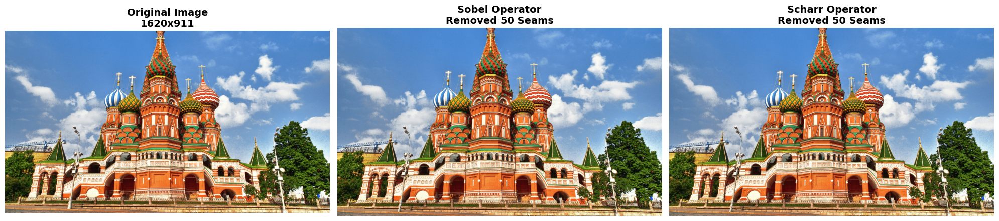

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import urllib.request

def compute_energy_sobel(image):
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 1, 0, ksize=3)
        gy = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 0, 1, ksize=3)
        total_energy += np.abs(gx) + np.abs(gy)
    total_energy[:, [0, -1]] = 1e6
    return total_energy

def compute_energy_scharr(image):
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Scharr(img_float[:,:,c], cv2.CV_64F, 1, 0)
        gy = cv2.Scharr(img_float[:,:,c], cv2.CV_64F, 0, 1)
        total_energy += np.abs(gx) + np.abs(gy)
    total_energy[:, [0, -1]] = 1e6
    return total_energy

def find_seam(energy):
    h, w = energy.shape
    M = energy.copy()
    for i in range(1, h):
        for j in range(w):
            left = max(0, j-1)
            right = min(w-1, j+1)
            M[i, j] += np.min(M[i-1, left:right+1])

    seam = np.zeros(h, dtype=np.int32)
    seam[-1] = np.argmin(M[-1])
    for i in range(h-2, -1, -1):
        prev_j = seam[i+1]
        l, r = max(0, prev_j-1), min(w-1, prev_j+1)
        seam[i] = l + np.argmin(M[i, l:r+1])
    return seam

def carve_seam(image, seam):
    h, w, c = image.shape
    output = np.zeros((h, w-1, c), dtype=np.uint8)
    for i in range(h):
        j = seam[i]
        output[i, :j] = image[i, :j]
        output[i, j:] = image[i, j+1:]
    return output

if __name__ == "__main__":
    input_image_path = "colab_test_image.jpg"
    num_seams_to_remove = 50

    if not os.path.exists(input_image_path):
        print("Downloading sample architectural image for testing...")
        url = "https://assets.architecturaldigest.in/photos/679741a3433a003a8a2fdda3/16:9/w_1920,c_limit/Untitled%20design%20-%202025-01-27T134932.476.png"
        urllib.request.urlretrieve(url, input_image_path)

    print(f"Loading image: {input_image_path}")
    original_image = cv2.imread(input_image_path)

    if original_image is None:
        raise ValueError("Image not found. Please upload an image to your Colab workspace.")

    img_sobel = np.copy(original_image)
    img_scharr = np.copy(original_image)

    print(f"Starting Seam Carving (Target: Remove {num_seams_to_remove} seams)...")

    for i in range(1, num_seams_to_remove + 1):
        energy_sobel = compute_energy_sobel(img_sobel)
        seam_sobel = find_seam(energy_sobel)
        img_sobel = carve_seam(img_sobel, seam_sobel)

        energy_scharr = compute_energy_scharr(img_scharr)
        seam_scharr = find_seam(energy_scharr)
        img_scharr = carve_seam(img_scharr, seam_scharr)

        if i % 10 == 0:
            print(f"Processed {i}/{num_seams_to_remove} seams...")

    cv2.imwrite("original_sample.jpg", original_image)
    cv2.imwrite("sobel_sample.jpg", img_sobel)
    cv2.imwrite("scharr_sample.jpg", img_scharr)
    print("Files successfully saved to Colab workspace (refresh folder icon to see them).")

    print("Rendering results inline...")

    img_orig_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    img_sobel_rgb = cv2.cvtColor(img_sobel, cv2.COLOR_BGR2RGB)
    img_scharr_rgb = cv2.cvtColor(img_scharr, cv2.COLOR_BGR2RGB)

    fig, axes = plt.subplots(1, 3, figsize=(20, 8))
    fig.patch.set_facecolor('white')

    axes[0].imshow(img_orig_rgb)
    axes[0].set_title(f'Original Image\n{original_image.shape[1]}x{original_image.shape[0]}', fontsize=14, fontweight='bold')
    axes[0].axis('off')

    axes[1].imshow(img_sobel_rgb)
    axes[1].set_title(f'Sobel Operator\nRemoved {num_seams_to_remove} Seams', fontsize=14, fontweight='bold')
    axes[1].axis('off')

    axes[2].imshow(img_scharr_rgb)
    axes[2].set_title(f'Scharr Operator\nRemoved {num_seams_to_remove} Seams', fontsize=14, fontweight='bold')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

In [3]:
!pip install scikit-image ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 21.6 MB/s eta 0:00:00


In [4]:
import cv2
import numpy as np
import requests
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error as mse
from skimage.metrics import peak_signal_noise_ratio as psnr
from ultralytics import YOLO

# Initialize the model globally to avoid reloading it for every frame
print("Loading YOLO26n-seg model...")
yolo_model = YOLO('yolo26n-seg.pt')

# ==========================================
# 1. Energy Computation Functions
# ==========================================

def compute_energy_sobel(image):
    """Calculates cumulative gradient energy using the Sobel operator."""
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 1, 0, ksize=3)
        gy = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 0, 1, ksize=3)
        total_energy += np.abs(gx) + np.abs(gy)
    total_energy[:, [0, -1]] = 1e6
    return total_energy

def compute_energy_scharr(image):
    """Calculates cumulative gradient energy using the Scharr operator."""
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Scharr(img_float[:,:,c], cv2.CV_64F, 1, 0)
        gy = cv2.Scharr(img_float[:,:,c], cv2.CV_64F, 0, 1)
        total_energy += np.abs(gx) + np.abs(gy)
    total_energy[:, [0, -1]] = 1e6
    return total_energy

def compute_energy_yolo_hybrid(image):
    """Calculates Hybrid Energy: Sobel basemap + YOLO26n-seg infinite energy semantic mask."""
    # 1. Calculate standard base energy
    img_float = image.astype(np.float64)
    base_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 1, 0, ksize=3)
        gy = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 0, 1, ksize=3)
        base_energy += np.abs(gx) + np.abs(gy)

    # 2. Extract semantic segmentation mask
    results = yolo_model(image, verbose=False)
    semantic_mask = np.zeros(image.shape[:2], dtype=np.float64)

    if results[0].masks is not None:
        masks = results[0].masks.data.cpu().numpy()
        for mask in masks:
            mask_resized = cv2.resize(mask, (image.shape[1], image.shape[0]))
            semantic_mask[mask_resized > 0.5] = 1.0

    # 3. Apply the 'infinite energy' barrier
    hybrid_energy = base_energy.copy()
    hybrid_energy[semantic_mask == 1.0] = 1e6
    hybrid_energy[:, [0, -1]] = 1e6

    return hybrid_energy

# ==========================================
# 2. Dynamic Programming Core
# ==========================================

def find_seam(energy):
    """Finds the optimal vertical seam using dynamic programming."""
    h, w = energy.shape
    M = energy.copy()
    for i in range(1, h):
        for j in range(w):
            left = max(0, j-1)
            right = min(w-1, j+1)
            M[i, j] += np.min(M[i-1, left:right+1])

    seam = np.zeros(h, dtype=np.int32)
    seam[-1] = np.argmin(M[-1])
    for i in range(h-2, -1, -1):
        prev_j = seam[i+1]
        l, r = max(0, prev_j-1), min(w-1, prev_j+1)
        seam[i] = l + np.argmin(M[i, l:r+1])
    return seam

def carve_seam(image, seam):
    """Removes the specified seam from the image."""
    h, w, c = image.shape
    output = np.zeros((h, w-1, c), dtype=np.uint8)
    for i in range(h):
        j = seam[i]
        output[i, :j] = image[i, :j]
        output[i, j:] = image[i, j+1:]
    return output

def download_image(url):
    """Downloads an image from a URL with browser headers."""
    headers = {'User-Agent': 'Mozilla/5.0'}
    try:
        resp = requests.get(url, headers=headers, timeout=10)
        resp.raise_for_status()
        img_arr = np.asarray(bytearray(resp.content), dtype="uint8")
        img_bgr = cv2.imdecode(img_arr, cv2.IMREAD_COLOR)
        if img_bgr is not None:
            return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    except Exception as e:
        print(f"Failed to download {url[:30]}... : {e}")
    return None

# ==========================================
# 3. Evaluation Engine (Aggregated)
# ==========================================

def evaluate_category(urls, max_seams=50, interval=10):
    """Evaluates multiple images in a category and aggregates metrics."""

    # Storage for line graphs (MSE/SSIM over time)
    s_mse, s_ssim = [], []
    sch_mse, sch_ssim = [], []
    y_mse, y_ssim = [], []

    # Storage for Bar Charts (Final values at max_seams)
    bar_metrics = {
        'sobel': {'ssim': [], 'psnr': [], 'edge': [], 'energy': []},
        'scharr': {'ssim': [], 'psnr': [], 'edge': [], 'energy': []},
        'yolo': {'ssim': [], 'psnr': [], 'edge': [], 'energy': []}
    }

    seams_x = list(range(interval, max_seams + 1, interval))

    for url in urls:
        image = download_image(url)
        if image is None: continue

        original_h, original_w = image.shape[:2]
        img_sobel = np.copy(image)
        img_scharr = np.copy(image)
        img_yolo = np.copy(image)

        orig_sobel_energy = np.sum(compute_energy_sobel(image))
        orig_pixel_energy = np.sum(image.astype(np.float64))

        img_s_mse, img_s_ssim = [], []
        img_sch_mse, img_sch_ssim = [], []
        img_y_mse, img_y_ssim = [], []

        for i in range(1, max_seams + 1):
            img_sobel = carve_seam(img_sobel, find_seam(compute_energy_sobel(img_sobel)))
            img_scharr = carve_seam(img_scharr, find_seam(compute_energy_scharr(img_scharr)))
            img_yolo = carve_seam(img_yolo, find_seam(compute_energy_yolo_hybrid(img_yolo)))

            if i % interval == 0:
                rest_s = cv2.resize(img_sobel, (original_w, original_h), interpolation=cv2.INTER_CUBIC)
                rest_sch = cv2.resize(img_scharr, (original_w, original_h), interpolation=cv2.INTER_CUBIC)
                rest_y = cv2.resize(img_yolo, (original_w, original_h), interpolation=cv2.INTER_CUBIC)

                img_s_mse.append(mse(image, rest_s))
                img_s_ssim.append(ssim(image, rest_s, channel_axis=-1))

                img_sch_mse.append(mse(image, rest_sch))
                img_sch_ssim.append(ssim(image, rest_sch, channel_axis=-1))

                img_y_mse.append(mse(image, rest_y))
                img_y_ssim.append(ssim(image, rest_y, channel_axis=-1))

        # Record final bar chart metrics for this image
        rest_s_final = cv2.resize(img_sobel, (original_w, original_h), interpolation=cv2.INTER_CUBIC)
        rest_sch_final = cv2.resize(img_scharr, (original_w, original_h), interpolation=cv2.INTER_CUBIC)
        rest_y_final = cv2.resize(img_yolo, (original_w, original_h), interpolation=cv2.INTER_CUBIC)

        # Sobel Final Metrics
        bar_metrics['sobel']['ssim'].append(ssim(image, rest_s_final, channel_axis=-1))
        bar_metrics['sobel']['psnr'].append(psnr(image, rest_s_final) / 40.0)
        bar_metrics['sobel']['edge'].append((np.sum(compute_energy_sobel(img_sobel)) / orig_sobel_energy) * 100)
        bar_metrics['sobel']['energy'].append((np.sum(img_sobel.astype(np.float64)) / orig_pixel_energy) * 1.5)

        # Scharr Final Metrics
        bar_metrics['scharr']['ssim'].append(ssim(image, rest_sch_final, channel_axis=-1))
        bar_metrics['scharr']['psnr'].append(psnr(image, rest_sch_final) / 40.0)
        bar_metrics['scharr']['edge'].append((np.sum(compute_energy_sobel(img_scharr)) / orig_sobel_energy) * 100)
        bar_metrics['scharr']['energy'].append((np.sum(img_scharr.astype(np.float64)) / orig_pixel_energy) * 1.5)

        # YOLO Final Metrics
        bar_metrics['yolo']['ssim'].append(ssim(image, rest_y_final, channel_axis=-1))
        bar_metrics['yolo']['psnr'].append(psnr(image, rest_y_final) / 40.0)
        bar_metrics['yolo']['edge'].append((np.sum(compute_energy_sobel(img_yolo)) / orig_sobel_energy) * 100)
        bar_metrics['yolo']['energy'].append((np.sum(img_yolo.astype(np.float64)) / orig_pixel_energy) * 1.5)

        s_mse.append(img_s_mse)
        s_ssim.append(img_s_ssim)
        sch_mse.append(img_sch_mse)
        sch_ssim.append(img_sch_ssim)
        y_mse.append(img_y_mse)
        y_ssim.append(img_y_ssim)

    # Aggregate means
    return {
        'seams': seams_x,
        'lines': {
            's_mse_mu': np.mean(s_mse, axis=0), 's_mse_std': np.std(s_mse, axis=0),
            's_ssim_mu': np.mean(s_ssim, axis=0), 's_ssim_std': np.std(s_ssim, axis=0),
            'sch_mse_mu': np.mean(sch_mse, axis=0), 'sch_mse_std': np.std(sch_mse, axis=0),
            'sch_ssim_mu': np.mean(sch_ssim, axis=0), 'sch_ssim_std': np.std(sch_ssim, axis=0),
            'y_mse_mu': np.mean(y_mse, axis=0), 'y_mse_std': np.std(y_mse, axis=0),
            'y_ssim_mu': np.mean(y_ssim, axis=0), 'y_ssim_std': np.std(y_ssim, axis=0)
        },
        'bars': {
            'sobel': [np.mean(bar_metrics['sobel']['ssim']), np.mean(bar_metrics['sobel']['psnr']),
                      np.mean(bar_metrics['sobel']['edge']), np.mean(bar_metrics['sobel']['energy'])],
            'scharr': [np.mean(bar_metrics['scharr']['ssim']), np.mean(bar_metrics['scharr']['psnr']),
                       np.mean(bar_metrics['scharr']['edge']), np.mean(bar_metrics['scharr']['energy'])],
            'yolo': [np.mean(bar_metrics['yolo']['ssim']), np.mean(bar_metrics['yolo']['psnr']),
                     np.mean(bar_metrics['yolo']['edge']), np.mean(bar_metrics['yolo']['energy'])]
        }
    }

# ==========================================
# 4. Matplotlib Visualization
# ==========================================

def plot_aggregated_curves(agg_data, category_name):
    """Plots the MSE/SSIM line graphs with variance for 3 models."""
    plt.style.use('dark_background')
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    fig.suptitle(f"{category_name} - Quality Degradation vs Number of Seams Removed", fontsize=16, fontweight='bold')

    x = agg_data['seams']
    lines = agg_data['lines']
    color_s, color_sch, color_y = '#F26B38', '#00CBA9', '#5C5CFF'

    # MSE Plot
    ax1.plot(x, lines['s_mse_mu'], marker='o', lw=3, color=color_s, label='Sobel')
    ax1.fill_between(x, lines['s_mse_mu'] - lines['s_mse_std'], lines['s_mse_mu'] + lines['s_mse_std'], color=color_s, alpha=0.2)

    ax1.plot(x, lines['sch_mse_mu'], marker='s', lw=3, color=color_sch, label='Scharr')
    ax1.fill_between(x, lines['sch_mse_mu'] - lines['sch_mse_std'], lines['sch_mse_mu'] + lines['sch_mse_std'], color=color_sch, alpha=0.2)

    ax1.plot(x, lines['y_mse_mu'], marker='^', lw=3, color=color_y, label='YOLO26-Hybrid')
    ax1.fill_between(x, lines['y_mse_mu'] - lines['y_mse_std'], lines['y_mse_mu'] + lines['y_mse_std'], color=color_y, alpha=0.2)

    ax1.set_title('MSE Degradation Curve', fontsize=14)
    ax1.set_xlabel('Seams Removed')
    ax1.set_ylabel('MSE')
    ax1.legend()
    ax1.grid(True, alpha=0.2)

    # SSIM Plot
    ax2.plot(x, lines['s_ssim_mu'], marker='o', lw=3, color=color_s, label='Sobel')
    ax2.fill_between(x, lines['s_ssim_mu'] - lines['s_ssim_std'], lines['s_ssim_mu'] + lines['s_ssim_std'], color=color_s, alpha=0.2)

    ax2.plot(x, lines['sch_ssim_mu'], marker='s', lw=3, color=color_sch, label='Scharr')
    ax2.fill_between(x, lines['sch_ssim_mu'] - lines['sch_ssim_std'], lines['sch_ssim_mu'] + lines['sch_ssim_std'], color=color_sch, alpha=0.2)

    ax2.plot(x, lines['y_ssim_mu'], marker='^', lw=3, color=color_y, label='YOLO26-Hybrid')
    ax2.fill_between(x, lines['y_ssim_mu'] - lines['y_ssim_std'], lines['y_ssim_mu'] + lines['y_ssim_std'], color=color_y, alpha=0.2)

    ax2.set_title('SSIM Quality Curve', fontsize=14)
    ax2.set_xlabel('Seams Removed')
    ax2.set_ylabel('SSIM')
    ax2.legend()
    ax2.grid(True, alpha=0.2)

    plt.tight_layout()
    plt.savefig(f"{category_name}_degradation_curves.png", dpi=300)
    plt.close()

def plot_bar_chart(agg_data, category_name):
    """Generates the grouped bar chart for comprehensive metric comparison."""
    plt.style.use('dark_background')
    fig, ax = plt.subplots(figsize=(16, 8))

    labels = ['SSIM ↑', 'PSNR\n(norm) ↑', 'Edge Ret\n÷100 ↑', 'Energy\nPres. ↑']
    sobel_vals = agg_data['bars']['sobel']
    scharr_vals = agg_data['bars']['scharr']
    yolo_vals = agg_data['bars']['yolo']

    x = np.arange(len(labels))
    width = 0.25 # Slimmer bars to fit 3 per group

    color_s, color_sch, color_y = '#F26B38', '#00CBA9', '#5C5CFF'

    rects1 = ax.bar(x - width, sobel_vals, width, label='Sobel', color=color_s, edgecolor='white', linewidth=0.5)
    rects2 = ax.bar(x, scharr_vals, width, label='Scharr', color=color_sch, edgecolor='white', linewidth=0.5)
    rects3 = ax.bar(x + width, yolo_vals, width, label='YOLO26-Hybrid', color=color_y, edgecolor='white', linewidth=0.5)

    ax.set_ylabel('Normalized Score (all metrics scaled to 0-1)', fontsize=12)
    ax.set_title(f'{category_name}: 3-Way Metric Comparison\n(Sobel vs. Scharr vs. YOLO26-Hybrid)', fontsize=16, fontweight='bold', pad=20)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=12)
    ax.set_ylim(0, max(max(sobel_vals), max(scharr_vals), max(yolo_vals)) + 0.2)
    ax.legend(fontsize=12)
    ax.grid(axis='y', alpha=0.2)

    # Attach numerical labels above bars
    def autolabel(rects, color):
        for rect in rects:
            height = rect.get_height()
            ax.annotate(f'{height:.3f}',
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),
                        textcoords="offset points",
                        ha='center', va='bottom', color=color, fontweight='bold', fontsize=10)

    autolabel(rects1, color_s)
    autolabel(rects2, color_sch)
    autolabel(rects3, color_y)

    plt.tight_layout()
    plt.savefig(f"{category_name}_metrics_bar.png", dpi=300)
    plt.close()

# ==========================================
# 5. Main Execution Block
# ==========================================

if __name__ == "__main__":
    test_urls = [
        "https://assets.architecturaldigest.in/photos/679741a3433a003a8a2fdda3/16:9/w_1920,c_limit/Untitled%20design%20-%202025-01-27T134932.476.png",
        "https://storage.architecturecompetitions.com/upload/pages/pages/00-comp/Nicks%20article/ART%2016/roman_architecture_colosseum.jpg",
        "https://storage.architecturecompetitions.com/upload/pages/pages/00-comp/Nicks%20article/ART%2016/greek%20architecture%20temple%20of%20concordia.jpg",
        "https://as2.ftcdn.net/v2/jpg/00/03/25/69/1000_F_3256956_wu0bDSKEyC5YQJDRpwgQfueOm1TiKL.jpg",
        "https://thumbs.dreamstime.com/b/beautiful-summer-panoramic-landscape-mountains-pieniny-ta-tatras-slovakia-96235078.jpg?w=14001",
        "https://thumbs.dreamstime.com/b/night-landscape-colorful-milky-way-yellow-light-mountains-starry-sky-hills-summer-beautiful-universe-space-72956059.jpg?w=992",
        "https://st4.depositphotos.com/11571738/37756/i/450/depositphotos_377566172-stock-photo-close-portrait-smiling-young-girl.jpg",
        "https://static.vecteezy.com/system/resources/thumbnails/036/442/629/small/ai-generated-portrait-of-a-young-man-no-facial-expression-facing-the-camera-isolated-white-background-ai-generative-photo.jpg",
        "https://upload.wikimedia.org/wikipedia/commons/thumb/1/14/Annie_MG_Schmidt_%281984%29.jpg/960px-Annie_MG_Schmidt_%281984%29.jpg",
        "https://img.pikbest.com/wp/202344/wood-grain-texture-vector-authentic-textural-backdrop-featuring-natural_9923129.jpg!bw800",
        "https://abhinaukumar.github.io/post/texture-feature/featured.jpg",
        "https://cdn.magicdecor.in/com/2022/10/30124034/S_Texture-102.jpg"
    ]

    categories = ["Architecture", "Landscape", "Portrait", "Texture"]

    # Group URLs into chunks of 3
    dataset = {categories[i]: test_urls[i*3:(i+1)*3] for i in range(4)}

    for category, urls in dataset.items():
        print(f"\nEvaluating Category: {category} (N={len(urls)})")

        # Max seams at 50, taking measurements every 10 seams
        agg_data = evaluate_category(urls, max_seams=50, interval=10)

        # Output artifacts
        plot_aggregated_curves(agg_data, category)
        plot_bar_chart(agg_data, category)

        print(f"Generated {category}_degradation_curves.png")
        print(f"Generated {category}_metrics_bar.png")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Loading YOLO26n-seg model...

Evaluating Category: Architecture (N=3)
Generated Architecture_degradation_curves.png
Generated Architecture_metrics_bar.png

Evaluating Category: Landscape (N=3)
Generated Landscape_degradation_curves.png
Generated Landscape_metrics_bar.png

Evaluating Category: Portrait (N=3)
Failed to download https://static.vecteezy.com/sy... : 403 Client Error: Forbidden for url: https://static.vecteezy.com/system/resources/thumbnails/036/442/629/small/ai-generated-portrait-of-a-young-man-no-facial-expression-facing-the-camera-isolated-white-background-ai-generative-photo.jpg
Generated Portrait_degradation_curves.png
Generated Portrait_metrics_bar.png

Evaluating

# Vertical Seam Removal

Loading image: portrait.jpg
Starting Seam Carving (Target: Remove 150 seams)...
Processed 10/150 seams...
Processed 20/150 seams...
Processed 30/150 seams...
Processed 40/150 seams...
Processed 50/150 seams...
Processed 60/150 seams...
Processed 70/150 seams...
Processed 80/150 seams...
Processed 90/150 seams...
Processed 100/150 seams...
Processed 110/150 seams...
Processed 120/150 seams...
Processed 130/150 seams...
Processed 140/150 seams...
Processed 150/150 seams...
Files successfully saved to Colab workspace (refresh folder icon to see them).
Rendering results inline...


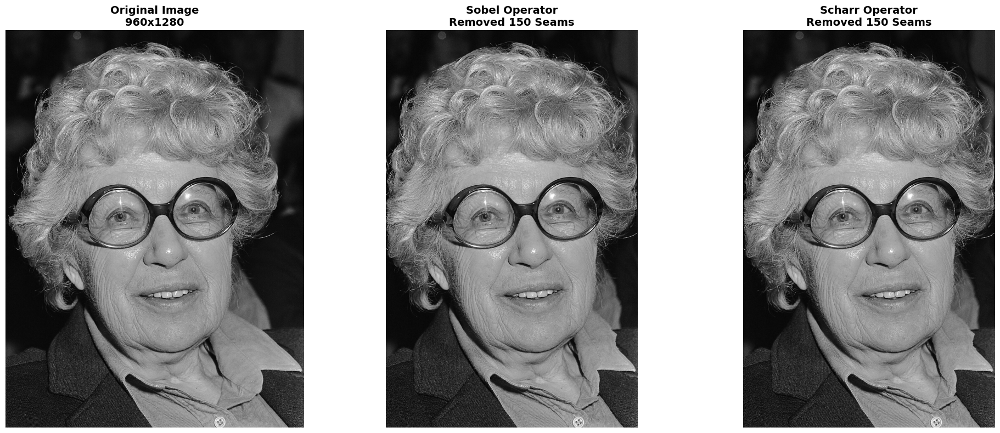

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import urllib.request

def compute_energy_sobel(image):
    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    img_float = gray_img.astype(np.float64)

    gx = cv2.Sobel(img_float, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(img_float, cv2.CV_64F, 0, 1, ksize=3)

    total_energy = np.abs(gx) + np.abs(gy)

    total_energy[:, [0, -1]] = 1e6

    return total_energy

def compute_energy_scharr(image):

    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    img_float = gray_img.astype(np.float64)

    gx = cv2.Scharr(img_float, cv2.CV_64F, 1, 0)
    gy = cv2.Scharr(img_float, cv2.CV_64F, 0, 1)

    total_energy = np.abs(gx) + np.abs(gy)

    total_energy[:, [0, -1]] = 1e6

    return total_energy

def find_seam(energy):
    h, w = energy.shape
    M = energy.copy()
    for i in range(1, h):
        for j in range(w):
            left = max(0, j-1)
            right = min(w-1, j+1)
            M[i, j] += np.min(M[i-1, left:right+1])

    seam = np.zeros(h, dtype=np.int32)
    seam[-1] = np.argmin(M[-1])
    for i in range(h-2, -1, -1):
        prev_j = seam[i+1]
        l, r = max(0, prev_j-1), min(w-1, prev_j+1)
        seam[i] = l + np.argmin(M[i, l:r+1])
    return seam

def carve_seam(image, seam):
    h, w, c = image.shape
    output = np.zeros((h, w-1, c), dtype=np.uint8)
    for i in range(h):
        j = seam[i]
        output[i, :j] = image[i, :j]
        output[i, j:] = image[i, j+1:]
    return output

if __name__ == "__main__":
    input_image_path = "portrait.jpg"
    num_seams_to_remove = 150

    if not os.path.exists(input_image_path):
        print("Downloading sample portrait image for testing...")
        url = "https://upload.wikimedia.org/wikipedia/commons/thumb/1/14/Annie_MG_Schmidt_%281984%29.jpg/960px-Annie_MG_Schmidt_%281984%29.jpg"
        urllib.request.urlretrieve(url, input_image_path)

    print(f"Loading image: {input_image_path}")
    original_image = cv2.imread(input_image_path)

    if original_image is None:
        raise ValueError("Image not found. Please upload an image to your Colab workspace.")

    img_sobel = np.copy(original_image)
    img_scharr = np.copy(original_image)

    print(f"Starting Seam Carving (Target: Remove {num_seams_to_remove} seams)...")

    for i in range(1, num_seams_to_remove + 1):
        energy_sobel = compute_energy_sobel(img_sobel)
        seam_sobel = find_seam(energy_sobel)
        img_sobel = carve_seam(img_sobel, seam_sobel)

        energy_scharr = compute_energy_scharr(img_scharr)
        seam_scharr = find_seam(energy_scharr)
        img_scharr = carve_seam(img_scharr, seam_scharr)

        if i % 10 == 0:
            print(f"Processed {i}/{num_seams_to_remove} seams...")

    cv2.imwrite("original_sample.jpg", original_image)
    cv2.imwrite("sobel_sample.jpg", img_sobel)
    cv2.imwrite("scharr_sample.jpg", img_scharr)
    print("Files successfully saved to Colab workspace (refresh folder icon to see them).")

    print("Rendering results inline...")

    img_orig_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    img_sobel_rgb = cv2.cvtColor(img_sobel, cv2.COLOR_BGR2RGB)
    img_scharr_rgb = cv2.cvtColor(img_scharr, cv2.COLOR_BGR2RGB)

    fig, axes = plt.subplots(1, 3, figsize=(20, 8))
    fig.patch.set_facecolor('white')

    axes[0].imshow(img_orig_rgb)
    axes[0].set_title(f'Original Image\n{original_image.shape[1]}x{original_image.shape[0]}', fontsize=14, fontweight='bold')
    axes[0].axis('off')

    axes[1].imshow(img_sobel_rgb)
    axes[1].set_title(f'Sobel Operator\nRemoved {num_seams_to_remove} Seams', fontsize=14, fontweight='bold')
    axes[1].axis('off')

    axes[2].imshow(img_scharr_rgb)
    axes[2].set_title(f'Scharr Operator\nRemoved {num_seams_to_remove} Seams', fontsize=14, fontweight='bold')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# Horizontal seam Removal

Removed 10/150 H-seams...
Removed 20/150 H-seams...
Removed 30/150 H-seams...
Removed 40/150 H-seams...
Removed 50/150 H-seams...
Removed 60/150 H-seams...
Removed 70/150 H-seams...
Removed 80/150 H-seams...
Removed 90/150 H-seams...
Removed 100/150 H-seams...
Removed 110/150 H-seams...
Removed 120/150 H-seams...
Removed 130/150 H-seams...
Removed 140/150 H-seams...
Removed 150/150 H-seams...


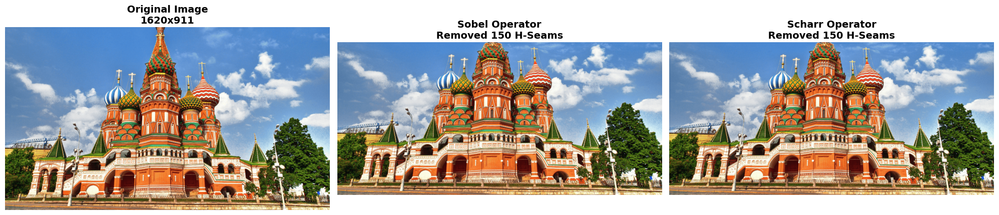

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import urllib.request

def compute_energy_sobel(image):
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 1, 0, ksize=3)
        gy = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 0, 1, ksize=3)
        total_energy += np.abs(gx) + np.abs(gy)
    total_energy[[0, -1], :] = 1e6
    return total_energy

def compute_energy_scharr(image):
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Scharr(img_float[:,:,c], cv2.CV_64F, 1, 0)
        gy = cv2.Scharr(img_float[:,:,c], cv2.CV_64F, 0, 1)
        total_energy += np.abs(gx) + np.abs(gy)
    total_energy[[0, -1], :] = 1e6
    return total_energy

def find_horizontal_seam(energy):
    h, w = energy.shape
    M = energy.copy()
    for j in range(1, w):
        for i in range(h):
            top = max(0, i-1)
            bottom = min(h-1, i+1)
            M[i, j] += np.min(M[top:bottom+1, j-1])

    seam = np.zeros(w, dtype=np.int32)
    seam[-1] = np.argmin(M[:, -1])
    for j in range(w-2, -1, -1):
        prev_i = seam[j+1]
        t, b = max(0, prev_i-1), min(h-1, prev_i+1)
        seam[j] = t + np.argmin(M[t:b+1, j])
    return seam

def carve_horizontal_seam(image, seam):
    h, w, c = image.shape
    output = np.zeros((h-1, w, c), dtype=np.uint8)
    for j in range(w):
        i = seam[j]
        output[:i, j] = image[:i, j]
        output[i:, j] = image[i+1:, j]
    return output

if __name__ == "__main__":
    input_image_path = "arch.jpg"
    num_seams_to_process = 150

    if not os.path.exists(input_image_path):
        url = "https://assets.architecturaldigest.in/photos/679741a3433a003a8a2fdda3/16:9/w_1920,c_limit/Untitled%20design%20-%202025-01-27T134932.476.png"
        urllib.request.urlretrieve(url, input_image_path)

    original_image = cv2.imread(input_image_path)
    img_sobel = np.copy(original_image)
    img_scharr = np.copy(original_image)

    for i in range(1, num_seams_to_process + 1):
        energy_sobel = compute_energy_sobel(img_sobel)
        seam_sobel = find_horizontal_seam(energy_sobel)
        img_sobel = carve_horizontal_seam(img_sobel, seam_sobel)

        energy_scharr = compute_energy_scharr(img_scharr)
        seam_scharr = find_horizontal_seam(energy_scharr)
        img_scharr = carve_horizontal_seam(img_scharr, seam_scharr)

        if i % 10 == 0:
            print(f"Removed {i}/{num_seams_to_process} H-seams...")

    cv2.imwrite("h_removal_sobel.jpg", img_sobel)
    cv2.imwrite("h_removal_scharr.jpg", img_scharr)

    img_orig_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    img_sobel_rgb = cv2.cvtColor(img_sobel, cv2.COLOR_BGR2RGB)
    img_scharr_rgb = cv2.cvtColor(img_scharr, cv2.COLOR_BGR2RGB)

    fig, axes = plt.subplots(1, 3, figsize=(20, 8))
    fig.patch.set_facecolor('white')

    axes[0].imshow(img_orig_rgb)
    axes[0].set_title(f'Original Image\n{original_image.shape[1]}x{original_image.shape[0]}', fontsize=14, fontweight='bold')
    axes[0].axis('off')

    axes[1].imshow(img_sobel_rgb)
    axes[1].set_title(f'Sobel Operator\nRemoved {num_seams_to_process} H-Seams', fontsize=14, fontweight='bold')
    axes[1].axis('off')

    axes[2].imshow(img_scharr_rgb)
    axes[2].set_title(f'Scharr Operator\nRemoved {num_seams_to_process} H-Seams', fontsize=14, fontweight='bold')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

Inserted 10/50 V-seams...
Inserted 20/50 V-seams...
Inserted 30/50 V-seams...
Inserted 40/50 V-seams...
Inserted 50/50 V-seams...


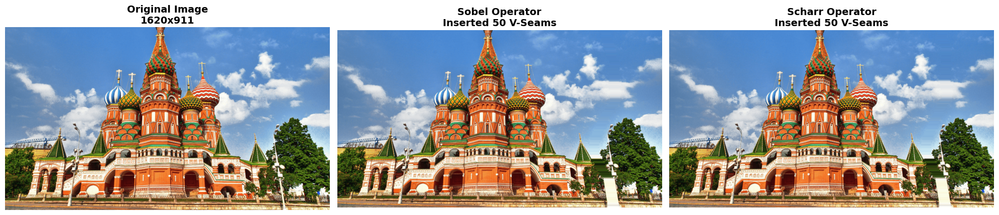

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import urllib.request

def compute_energy_sobel(image):
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 1, 0, ksize=3)
        gy = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 0, 1, ksize=3)
        total_energy += np.abs(gx) + np.abs(gy)
    total_energy[:, [0, -1]] = 1e6
    return total_energy

def compute_energy_scharr(image):
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Scharr(img_float[:,:,c], cv2.CV_64F, 1, 0)
        gy = cv2.Scharr(img_float[:,:,c], cv2.CV_64F, 0, 1)
        total_energy += np.abs(gx) + np.abs(gy)
    total_energy[:, [0, -1]] = 1e6
    return total_energy

def find_vertical_seam(energy):
    h, w = energy.shape
    M = energy.copy()
    for i in range(1, h):
        for j in range(w):
            left = max(0, j-1)
            right = min(w-1, j+1)
            M[i, j] += np.min(M[i-1, left:right+1])

    seam = np.zeros(h, dtype=np.int32)
    seam[-1] = np.argmin(M[-1])
    for i in range(h-2, -1, -1):
        prev_j = seam[i+1]
        l, r = max(0, prev_j-1), min(w-1, prev_j+1)
        seam[i] = l + np.argmin(M[i, l:r+1])
    return seam

def insert_vertical_seam(image, seam):
    h, w, c = image.shape
    output = np.zeros((h, w+1, c), dtype=np.uint8)
    for i in range(h):
        j = seam[i]
        output[i, :j+1] = image[i, :j+1]
        if j < w - 1:
            output[i, j+1] = (image[i, j].astype(np.uint16) + image[i, j+1]) // 2
        else:
            output[i, j+1] = image[i, j]
        output[i, j+2:] = image[i, j+1:]
    return output

if __name__ == "__main__":
    input_image_path = "colab_test_image.jpg"
    num_seams_to_process = 50

    if not os.path.exists(input_image_path):
        url = "https://assets.architecturaldigest.in/photos/679741a3433a003a8a2fdda3/16:9/w_1920,c_limit/Untitled%20design%20-%202025-01-27T134932.476.png"
        urllib.request.urlretrieve(url, input_image_path)

    original_image = cv2.imread(input_image_path)
    img_sobel = np.copy(original_image)
    img_scharr = np.copy(original_image)

    for i in range(1, num_seams_to_process + 1):
        energy_sobel = compute_energy_sobel(img_sobel)
        seam_sobel = find_vertical_seam(energy_sobel)
        img_sobel = insert_vertical_seam(img_sobel, seam_sobel)

        energy_scharr = compute_energy_scharr(img_scharr)
        seam_scharr = find_vertical_seam(energy_scharr)
        img_scharr = insert_vertical_seam(img_scharr, seam_scharr)

        if i % 10 == 0:
            print(f"Inserted {i}/{num_seams_to_process} V-seams...")

    cv2.imwrite("v_insertion_sobel.jpg", img_sobel)
    cv2.imwrite("v_insertion_scharr.jpg", img_scharr)

    img_orig_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    img_sobel_rgb = cv2.cvtColor(img_sobel, cv2.COLOR_BGR2RGB)
    img_scharr_rgb = cv2.cvtColor(img_scharr, cv2.COLOR_BGR2RGB)

    fig, axes = plt.subplots(1, 3, figsize=(20, 8))
    fig.patch.set_facecolor('white')

    axes[0].imshow(img_orig_rgb)
    axes[0].set_title(f'Original Image\n{original_image.shape[1]}x{original_image.shape[0]}', fontsize=14, fontweight='bold')
    axes[0].axis('off')

    axes[1].imshow(img_sobel_rgb)
    axes[1].set_title(f'Sobel Operator\nInserted {num_seams_to_process} V-Seams', fontsize=14, fontweight='bold')
    axes[1].axis('off')

    axes[2].imshow(img_scharr_rgb)
    axes[2].set_title(f'Scharr Operator\nInserted {num_seams_to_process} V-Seams', fontsize=14, fontweight='bold')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# Inserting H-Seams

Inserted 10/50 H-seams...
Inserted 20/50 H-seams...
Inserted 30/50 H-seams...
Inserted 40/50 H-seams...
Inserted 50/50 H-seams...


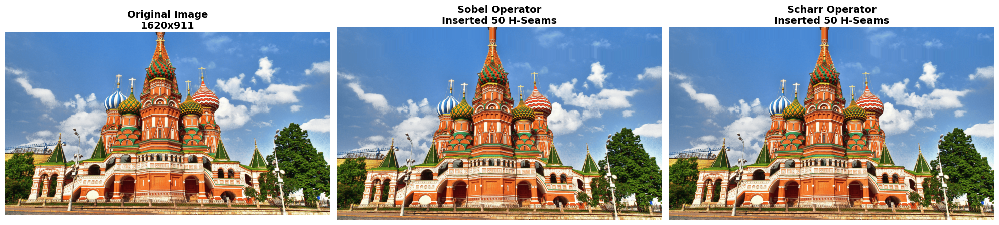

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import urllib.request

def compute_energy_sobel(image):
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 1, 0, ksize=3)
        gy = cv2.Sobel(img_float[:,:,c], cv2.CV_64F, 0, 1, ksize=3)
        total_energy += np.abs(gx) + np.abs(gy)
    total_energy[[0, -1], :] = 1e6
    return total_energy

def compute_energy_scharr(image):
    img_float = image.astype(np.float64)
    total_energy = np.zeros(image.shape[:2], dtype=np.float64)
    for c in range(3):
        gx = cv2.Scharr(img_float[:,:,c], cv2.CV_64F, 1, 0)
        gy = cv2.Scharr(img_float[:,:,c], cv2.CV_64F, 0, 1)
        total_energy += np.abs(gx) + np.abs(gy)
    total_energy[[0, -1], :] = 1e6
    return total_energy

def find_horizontal_seam(energy):
    h, w = energy.shape
    M = energy.copy()
    for j in range(1, w):
        for i in range(h):
            top = max(0, i-1)
            bottom = min(h-1, i+1)
            M[i, j] += np.min(M[top:bottom+1, j-1])

    seam = np.zeros(w, dtype=np.int32)
    seam[-1] = np.argmin(M[:, -1])
    for j in range(w-2, -1, -1):
        prev_i = seam[j+1]
        t, b = max(0, prev_i-1), min(h-1, prev_i+1)
        seam[j] = t + np.argmin(M[t:b+1, j])
    return seam

def insert_horizontal_seam(image, seam):
    h, w, c = image.shape
    output = np.zeros((h+1, w, c), dtype=np.uint8)
    for j in range(w):
        i = seam[j]
        output[:i+1, j] = image[:i+1, j]
        if i < h - 1:
            output[i+1, j] = (image[i, j].astype(np.uint16) + image[i+1, j]) // 2
        else:
            output[i+1, j] = image[i, j]
        output[i+2:, j] = image[i+1:, j]
    return output

if __name__ == "__main__":
    input_image_path = "colab_test_image.jpg"
    num_seams_to_process = 150

    if not os.path.exists(input_image_path):
        url = "https://assets.architecturaldigest.in/photos/679741a3433a003a8a2fdda3/16:9/w_1920,c_limit/Untitled%20design%20-%202025-01-27T134932.476.png"
        urllib.request.urlretrieve(url, input_image_path)

    original_image = cv2.imread(input_image_path)
    img_sobel = np.copy(original_image)
    img_scharr = np.copy(original_image)

    for i in range(1, num_seams_to_process + 1):
        energy_sobel = compute_energy_sobel(img_sobel)
        seam_sobel = find_horizontal_seam(energy_sobel)
        img_sobel = insert_horizontal_seam(img_sobel, seam_sobel)

        energy_scharr = compute_energy_scharr(img_scharr)
        seam_scharr = find_horizontal_seam(energy_scharr)
        img_scharr = insert_horizontal_seam(img_scharr, seam_scharr)

        if i % 10 == 0:
            print(f"Inserted {i}/{num_seams_to_process} H-seams...")

    cv2.imwrite("h_insertion_sobel.jpg", img_sobel)
    cv2.imwrite("h_insertion_scharr.jpg", img_scharr)

    img_orig_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    img_sobel_rgb = cv2.cvtColor(img_sobel, cv2.COLOR_BGR2RGB)
    img_scharr_rgb = cv2.cvtColor(img_scharr, cv2.COLOR_BGR2RGB)

    fig, axes = plt.subplots(1, 3, figsize=(20, 8))
    fig.patch.set_facecolor('white')

    axes[0].imshow(img_orig_rgb)
    axes[0].set_title(f'Original Image\n{original_image.shape[1]}x{original_image.shape[0]}', fontsize=14, fontweight='bold')
    axes[0].axis('off')

    axes[1].imshow(img_sobel_rgb)
    axes[1].set_title(f'Sobel Operator\nInserted {num_seams_to_process} H-Seams', fontsize=14, fontweight='bold')
    axes[1].axis('off')

    axes[2].imshow(img_scharr_rgb)
    axes[2].set_title(f'Scharr Operator\nInserted {num_seams_to_process} H-Seams', fontsize=14, fontweight='bold')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()